**Name:** Trần Đức Thuỵ

**Gmail:** tdthuycg2001@gmail.com

**Address:** Ho Chi Minh City

# IMPORT LIBRARIES

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
from sklearn.metrics import mean_squared_error
sns.set()

# FPT Data

## Read data

In [19]:
# Đọc dữ liệu
fpt_data = pd.read_csv("FPT.csv")
fpt_data

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
0,FPT,12/25/2018 9:15,30.89,30.89,30.89,30.89,35410,0
1,FPT,12/25/2018 9:16,30.81,30.81,30.81,30.81,190,0
2,FPT,12/25/2018 9:17,30.74,30.81,30.74,30.74,1120,0
3,FPT,12/25/2018 9:18,30.74,30.74,30.74,30.74,2120,0
4,FPT,12/25/2018 9:19,30.74,30.74,30.74,30.74,22500,0
...,...,...,...,...,...,...,...,...
97401,FPT,12/22/2020 14:24,58.20,58.20,58.20,58.20,27470,0
97402,FPT,12/22/2020 14:25,58.20,58.20,58.20,58.20,14820,0
97403,FPT,12/22/2020 14:26,58.20,58.20,58.20,58.20,500,0
97404,FPT,12/22/2020 14:29,58.10,58.10,58.10,58.10,2500,0


- Dữ liệu có tổng cộng: **97406 dòng và 8 cột**

In [20]:
# Kiểm tra dòng trùng
print("Number of duplicated rows: ",np.sum(fpt_data.duplicated()))

Number of duplicated rows:  0


- Dữ liệu không có dòng trùng nhau

In [21]:
# Kiểm tra kiểu dữ liệu
fpt_data.dtypes

Ticker            object
Date/Time         object
Open             float64
High             float64
Low              float64
Close            float64
Volume             int64
Open Interest      int64
dtype: object

In [22]:
# Chuyển đổi kiểu dữ liệu cột Date/Time từ object sang datetime
fpt_data["Date/Time"] = pd.to_datetime(fpt_data["Date/Time"], format="%m/%d/%Y %H:%M")
fpt_data["Date/Time"]

0       2018-12-25 09:15:00
1       2018-12-25 09:16:00
2       2018-12-25 09:17:00
3       2018-12-25 09:18:00
4       2018-12-25 09:19:00
                ...        
97401   2020-12-22 14:24:00
97402   2020-12-22 14:25:00
97403   2020-12-22 14:26:00
97404   2020-12-22 14:29:00
97405   2020-12-22 14:46:00
Name: Date/Time, Length: 97406, dtype: datetime64[ns]

## Descriptive Statistics

### Numerical data 

In [23]:
nume_df = fpt_data.select_dtypes(include=np.number)
missing_percentage = np.sum(nume_df.isna(), axis=0)*100/len(fpt_data)
mean_sr = np.mean(nume_df, axis=0)
std_sr = np.std(nume_df, axis =0)
median_sr = np.median(nume_df, axis=0)
max_sr = np.max(nume_df, axis=0)
min_sr = np.min(nume_df,axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Mean":mean_sr, "Standard Deviation": std_sr, "Median": median_sr, "Max":max_sr, "Min": min_sr})
statistic_df.T

,Open,High,Low,Close,Volume,Open Interest
Missing Percentage,0.00000,0.000000,0.000000,0.000000,0.000000e+00,0.0
Mean,45.07163,45.090138,45.051430,45.071631,8.044173e+03,0.0
Standard Deviation,6.35977,6.364918,6.354213,6.359766,1.753194e+04,0.0
Median,46.95000,46.950000,46.950000,46.950000,2.960000e+03,0.0
Max,58.40000,58.500000,58.400000,58.400000,1.255930e+06,0.0
Min,30.25000,30.250000,30.220000,30.250000,1.000000e+01,0.0


**Nhận xét:**
- Các cột thuộc tính đều không có dữ liệu bị thiếu
- Không có các dòng dữ liệu trùng nhau
- Các cột dữ liệu đều có giá trị dương, không có giá trị không hợp lệ (invalid data)
- Cột Open Interest có các giá trị đều là 0.0, khi thiết kế mô hình dự đoán có thể cân nhắc loại bỏ cột này

### Categorical data

In [24]:
# Kiểm tra khoảng của dữ liệu thời gian
oldest_dt = fpt_data["Date/Time"].sort_values().values[0]
latest_dt = fpt_data["Date/Time"].sort_values().values[-1]
oldest_dt, latest_dt

(numpy.datetime64('2018-12-25T09:15:00.000000000'),
 numpy.datetime64('2020-12-22T14:46:00.000000000'))

**Do thị trường chứng khoán mở phiên vào 9:00 và đóng cửa lúc 15:00 nên cần kiểm tra thời gian có thoả mãn điều kiện này hay không?**
- Hàm *check_datetime* sẽ kiểm tra từng giá trị trong thuộc tính Date/Time, trả về True nếu thoả điều kiện ngược lại trả về False
- Biến *number_valid_value* là số những dữ liệu thoả điều kiện
- Cuối cùng sẽ in ra số dữ liệu không thoả mãn: *len(data) - number_valid_value*

In [25]:
def check_datetime(datetime):
    time = datetime.time()
    start = dt.time(9,0)
    end = dt.time(15,0)
    if time>=start and time<=end:
        return True
    return False

number_valid_value = np.sum(fpt_data["Date/Time"].apply(check_datetime))

print("\nSo du lieu thoi gian khong hop le: ", len(fpt_data) - number_valid_value, "\n")


So du lieu thoi gian khong hop le:  0 



In [26]:
cate_df = fpt_data.select_dtypes(include=["object","datetime"])
missing_percentage = np.sum(cate_df.isna(), axis=0)*100/len(fpt_data)
unique_sr = cate_df.nunique(axis=0)
statistic_df = pd.DataFrame({"Missing Percentage": missing_percentage,"Num_unique": unique_sr})
statistic_df

,Missing Percentage,Num_unique
Ticker,0.0,1
Date/Time,0.0,97406


**Nhận xét:**
- Các nhãn cổ phiếu đều đồng nhất (mã FPT)
- Các giá trị date/time là phân biệt, không có giá trị thời gian trùng lặp
- Không có dữ liệu không hợp lệ, các giao dịch trong ngày đều nằm trong khoảng thời gian **9:00 - 15:00**
- Dữ liệu từ **25/12/2018 - 22/12/2020**

## Data Visualization

In [27]:
# Biểu đồ thể hiện biến động giá mở cửa và đóng cửa theo thời gian 
fig1 = px.line(fpt_data, x="Date/Time", y="Open",color_discrete_sequence=["green"], title="Open price by date")
fig2 = px.line(fpt_data, x="Date/Time", y="Close",color_discrete_sequence=["red"], title="Close price by date")
fig1.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig2.update_layout(
    autosize=False,
    width=1000,
    height=500)
fig1.show()
fig2.show()

In [28]:
fig3 = px.bar(fpt_data.groupby(fpt_data["Date/Time"].dt.date)["Volume"].mean().reset_index(), x="Date/Time", y="Volume",color_discrete_sequence=["red"],title="Volume by date")
fig3.update_layout(
    autosize=False,
    width=1000,
    height=600)
fig3.show()

In [29]:
mean_squared_error(fpt_data["Open"], fpt_data["Close"])

0.0024049185881773196

**Nhận xét:**
- Biến thiên giá Open và Close có sự chênh lệch không nhiều, độ đo MSE= 0.315184 với 125309 mẫu 


**Trực quan hoá yếu tố Trend, Seasonality, Noise của chuỗi thời gian**

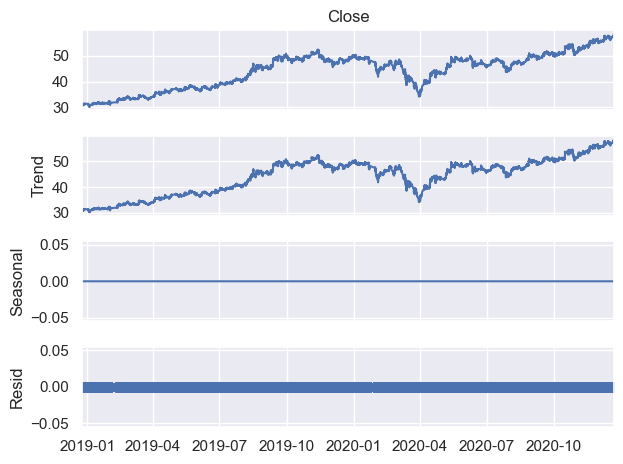

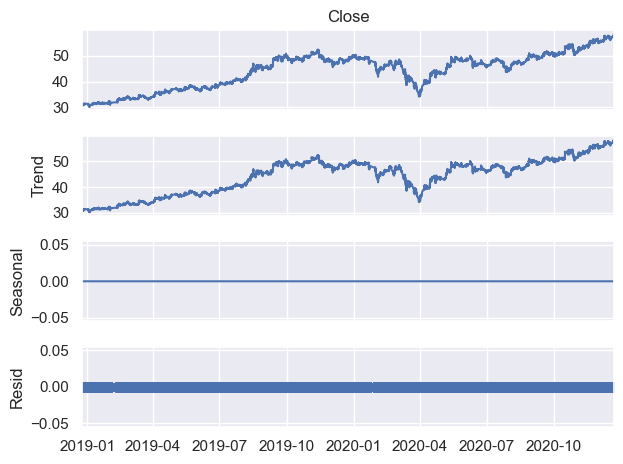

In [30]:
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse

df = fpt_data.copy()
df = df.set_index(["Date/Time"])

#Ta xem giá trị chuỗi thời gian là tổng các yếu tố Trend, Seasonality và Noise


result_add = seasonal_decompose(df["Close"], model='additive',extrapolate_trend='freq', period=1)

result_add.plot()


**Nhận xét:**
- Giá cổ phiếu không có tính seasonality 

## Data Exploration

In [31]:
# Số ngày giao dịch
len(fpt_data.groupby(fpt_data["Date/Time"].dt.date))

499

In [32]:
#Tổng lượng cổ phiếu giao dịch
total_volume = np.sum(fpt_data["Volume"])
total_volume

783550680

In [33]:
# Xem ngày có giá đóng cửa thấp nhất
fpt_data.groupby(fpt_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time").iloc[-1]).sort_values("Close").head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2019-01-03,FPT,2019-01-03 14:46:00,30.44,30.44,30.44,30.44,27490,0
2018-12-25,FPT,2018-12-25 09:21:00,30.66,30.74,30.59,30.66,16480,0
2019-01-04,FPT,2019-01-04 14:46:00,30.66,30.66,30.66,30.66,33310,0
2019-01-02,FPT,2019-01-02 14:46:00,30.74,30.74,30.74,30.74,64860,0
2018-12-26,FPT,2018-12-26 14:46:00,30.89,30.89,30.89,30.89,23190,0
2018-12-27,FPT,2018-12-27 14:46:00,31.19,31.19,31.19,31.19,38230,0
2019-01-07,FPT,2019-01-07 14:46:00,31.19,31.19,31.19,31.19,2260,0
2019-01-08,FPT,2019-01-08 14:46:00,31.34,31.34,31.34,31.34,21150,0
2019-01-18,FPT,2019-01-18 14:46:00,31.34,31.34,31.34,31.34,40690,0


In [34]:
# Xem ngày có giá đóng cửa cao nhất
fpt_data.groupby(fpt_data["Date/Time"].dt.date).apply(lambda x: x.sort_values("Date/Time", ascending=False).iloc[-1]).sort_values("Close",
                                                                                                                                 ascending=False).head(10)

,Ticker,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,,
2020-12-15,FPT,2020-12-15 09:15:00,57.5,57.5,57.4,57.5,50140,0
2020-12-22,FPT,2020-12-22 09:15:00,57.4,57.4,57.4,57.4,28200,0
2020-12-21,FPT,2020-12-21 09:15:00,57.3,57.4,57.3,57.4,38080,0
2020-12-10,FPT,2020-12-10 09:15:00,57.0,57.3,57.0,57.3,91660,0
2020-12-16,FPT,2020-12-16 09:15:00,57.2,57.2,57.2,57.2,32710,0
2020-12-14,FPT,2020-12-14 09:15:00,57.0,57.0,57.0,57.0,38990,0
2020-12-18,FPT,2020-12-18 09:15:00,56.5,56.8,56.5,56.8,55320,0
2020-12-17,FPT,2020-12-17 09:15:00,56.9,56.9,56.8,56.8,96300,0
2020-11-30,FPT,2020-11-30 09:15:00,56.7,56.7,56.6,56.6,228570,0


In [35]:
# Xem ngày có lượng giao dịch nhiều nhất
fpt_data.groupby(fpt_data["Date/Time"].dt.date)["Volume"].sum().sort_values(ascending=False)

Date/Time
2020-05-13    6853810
2019-11-04    5811560
2020-10-16    5769540
2020-11-19    4980430
2019-11-14    4799390
               ...   
2019-01-10     207330
2019-01-23     193460
2019-01-16     186590
2019-01-22     141480
2018-12-25      84960
Name: Volume, Length: 499, dtype: int64

In [36]:
# Kiểm tra tháng có ngày mà khối lượng giao dịch cao nhất
df = fpt_data.groupby(fpt_data["Date/Time"].dt.date).agg({"Close":"mean","Volume":"sum"})
df = df.reset_index()
df["Date/Time"] = pd.to_datetime(df["Date/Time"])
df.loc[(df["Date/Time"].dt.month==10) & (df["Date/Time"].dt.year==2020),:]

,Date/Time,Close,Volume
440,2020-10-01,50.487619,905510
441,2020-10-02,50.458416,1947940
442,2020-10-05,50.285990,1498360
443,2020-10-06,50.562927,1520290
444,2020-10-07,50.449074,1493710
445,2020-10-08,50.887892,3062690
446,2020-10-09,50.955670,1173500
447,2020-10-12,50.943128,1550680
448,2020-10-13,50.718041,1222200
449,2020-10-14,50.894521,2409760


In [37]:
# Thống kê cho từng năm
fpt_data.iloc[:,1:].groupby(by=fpt_data["Date/Time"].dt.year).mean()

,Date/Time,Open,High,Low,Close,Volume,Open Interest
Date/Time,,,,,,,
2018,2018-12-27 10:32:57.532133888,31.226838,31.231954,31.221928,31.226992,3240.565553,0.0
2019,2019-07-20 07:51:25.573770496,41.703981,41.718058,41.689055,41.704251,6961.208406,0.0
2020,2020-07-02 04:42:05.490105600,48.090736,48.113181,48.065854,48.090502,9017.681494,0.0


**Nhận xét:**
- Tổng cộng có 499 ngày với 783.550.680 đã được giao dịch. Mức giá cao nhất được thiết lập **57.000đ/cp** vào **15/12/2020**. Từ 03/2019 - 04/2019, chứng kiến  xu hướng giảm của cổ phiếu FPT, về mức thấp nhất dao động quanh **34.000đ/cp**. Các khoảng thời gian khác giá cổ phiếu dao động quanh **45.000đ/cp**
- Khối lượng giao dịch lớn nhất được ghi nhận vào **13/05/2020, 6.853.810 cổ phiếu**. Sau thời điểm giá cổ phiếu có xu hướng tăng dần. 
- Nhìn chung từ giữa đến cuối năm 2020, các cổ phiếu MSN, FPT, VIC, PNJ chạm đáy và bắt đầu tăng nhẹ. Đối với FPT, VIC, PNJ giá cổ có xu hướng tăng dần, sức mua tăng mạnh, chứng tỏ có dòng tiền lớn được đổ vào các cổ phiếu này. Riêng với MSN, giữa năm 2020, giá cổ phiếu có dấu hiệu dậm chân, ảnh hưởng tiêu cực bởi các đợt bùng phát Covid-19 khiến sức mua giảm, ảnh hưởng mạnh lên ngành bán lẻ.

## ARIMA MODEL

In [38]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

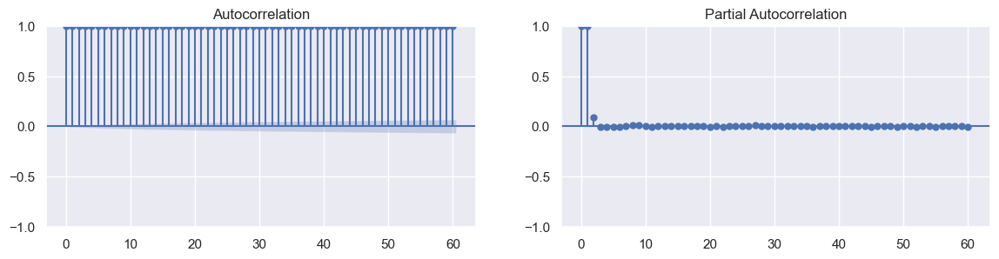

In [39]:
fig, axes = plt.subplots(1,2,figsize=(14,3), dpi= 100)
plot_acf(fpt_data["Close"].values.tolist(), lags=60,ax=axes[0])
plot_pacf(fpt_data["Close"].values.tolist(), lags=60, ax=axes[1]);

In [44]:
from pmdarima.arima import auto_arima
grid_arima = auto_arima(fpt_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                        d=0, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1020241.961, Time=0.66 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=inf, Time=17.35 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=inf, Time=6.17 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-263566.159, Time=25.11 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=32.65 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-263623.548, Time=34.81 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=inf, Time=13.89 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=141.02 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-263639.990, Time=14.21 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=381580.902, Time=20.27 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-263567.950, Time=13.75 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-263654.666, Time=35.93 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-263631.084, Time=5.18 sec

Best model:  ARIMA(2,0,2)(0,0,0)[0] intercept
Total fit time: 361.024 seconds


In [41]:
grid_arima = auto_arima(fpt_data["Close"].values, start_p=0, start_q=0, max_p=2, max_q=2,
                       d=1, start_P = 0, seasonal=False, ic=["aic"], trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-260655.242, Time=9.56 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-263642.366, Time=12.10 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-263583.033, Time=10.92 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-260655.356, Time=3.95 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-263645.767, Time=11.48 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-263642.205, Time=39.42 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-263645.074, Time=5.93 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=-263645.044, Time=9.38 sec

Best model:  ARIMA(2,1,0)(0,0,0)[0] intercept
Total fit time: 102.753 seconds


**Mô hình ARIMA(2,1,0) có kết quả tốt nhất**

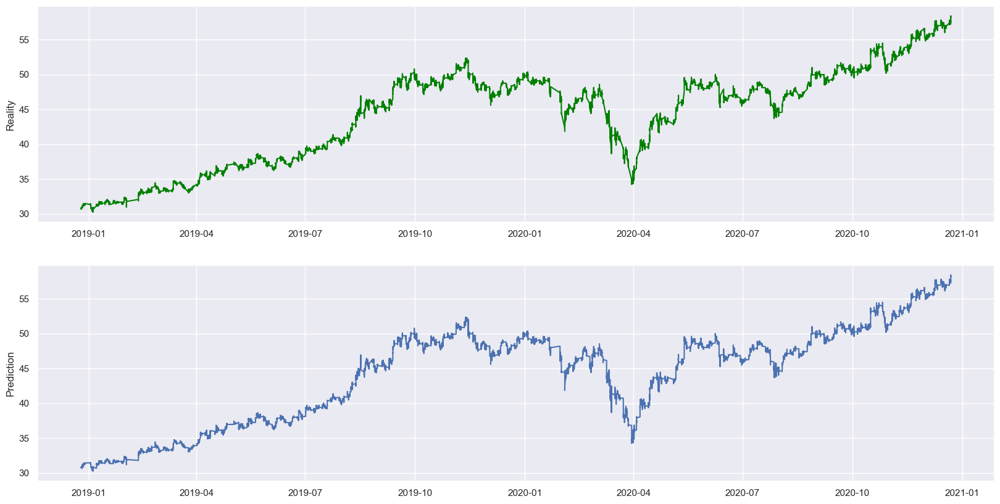

In [45]:
arima = ARIMA(fpt_data["Close"].values, order = (2,1,0))
model = arima.fit()
predict = model.predict()
predict[0] = predict[1]
fig, axes = plt.subplots(2,1,figsize=(20,10))
axes[1].plot(fpt_data["Date/Time"],predict)
axes[1].set_ylabel("Prediction")
axes[0].plot(fpt_data["Date/Time"], fpt_data["Close"], color="Green")
axes[0].set_ylabel("Reality")
plt.show()

In [46]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                97406
Model:                 ARIMA(2, 1, 0)   Log Likelihood              131825.522
Date:                Tue, 14 Nov 2023   AIC                        -263645.044
Time:                        11:53:53   BIC                        -263616.584
Sample:                             0   HQIC                       -263636.397
                              - 97406                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1751      0.001   -160.761      0.000      -0.177      -0.173
ar.L2         -0.0074      0.002     -4.205      0.000      -0.011      -0.004
sigma2         0.0039   2.59e-06   1507.315      0.000       0.004       0.004
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):          42704253.54
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.62   Skew:                            -1.95
Prob(H) (two-sided):                  0.00   Kurtosis:                       105.50
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

**Nhận xét:**
- Mô hình ARIMA(2,0,2) cho kết quả gần khớp với dữ liệu thực giá đóng cửa của cổ phiếu PNJ
- Độ đo AIC = -263645.044
- Các tham số của mô hình có **p_value < 0.05, có ý nghĩa về mặt thống kê**